In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [10]:
import pandas as pd
import numpy as np
import random
import s3fs

from library import lib_aws, metrics, esp, preprocess

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

In [7]:
# Opttions
pd.set_option('display.max_rows', 500)
mpl.rcParams['figure.figsize'] = (25,5)
mpl.rcParams['axes.grid'] = False
plt.style.use('dark_background')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

Helper Functions

# Importing Data and Failures

In [11]:
# Import failures
path = r's3://et-oasis/failure-esp/Oasis ESP Failure Analysis.xlsx'
failure_df = pd.read_excel(path)

failure_df['WELL_NAME'] = failure_df['WELL_NAME'].apply(preprocess.node_clean)  # clean well names
failure_df['Reason For Pull'] = failure_df['Reason For Pull'].fillna('Unknown')  # fill in nan values

failure_df = failure_df[['WELL_NAME', 'Install Date', 'Start Date', 'Fail Date', 'Run Life (Days)', 'Reason For Pull']]  # change columns if need be

failure_df.rename(columns={'WELL_NAME': 'NodeID'}, inplace=True)
fail_wells = list(failure_df.NodeID.unique())  # List of wells that are present in failure df
failure_df.sample(5)

,NodeID,Install Date,Start Date,Fail Date,Run Life (Days),Reason For Pull
33,Om Erickson 5501 44-7 8BX,2019-07-03,2019-07-04,2020-03-04,244,Unknown
59,Dawson 5494 42-12 5B,2019-03-21,2019-03-22,2019-11-10,237,Grounded downhole
74,Twobins 5501 13-29 3B,2019-02-17,2019-02-18,2019-09-10,204,Broken Shaft
22,Crane Federal 5300 34-27 7B,2019-11-23,2019-11-24,2020-04-16,144,Grounded downhole
16,Osprey 5401 44-23H,2019-10-02,2019-10-03,2020-05-14,224,Grounded downhole


In [6]:
%%time
# Import data
query = """
select * from m_esp_data
where "NodeID" in {}
""".format(tuple(fail_wells))

with lib_aws.PostgresRDS(db='esp-data') as engine:
    full_data = pd.read_sql(query, engine, parse_dates=['Date'])

wells_in_data = full_data.NodeID.unique()
full_data.sample(5)

Wall time: 6min 58s


,NodeID,Date,MotorCurrent,Frequency,OutputAmps,OutputVolts,PIP,PDP,TubingPressure,CasingPressure,PIT,MotorTemperature,XVib,YVib
2817065,Martin 5302 11-4 4B,2019-08-19 04:45:21,39.7,56.400000,NaN,NaN,842.10000,4567.0,162.0,138.0,237.0,272.0,2.0,NaN
1349109,Drummond 5501 42-21 3B,2019-11-28 22:05:45,0.0,0.000000,NaN,NaN,370.00000,377.0,0.0,68.0,242.0,243.0,2.0,NaN
2176656,Kaitlin Federal 5693 41-28B,2020-11-01 18:57:31,27.1,61.599998,NaN,NaN,499.39999,4323.0,226.0,5.0,233.0,257.0,10.0,NaN
3980362,Wade Federal 5300 41-30 9B,2020-01-12 06:00:20,35.0,55.000000,230.0,439.0,1297.00000,0.0,227.5,274.0,247.0,282.0,91.0,92.0
2270331,Kjos Federal 5501 11-18 9BX,2019-10-28 03:32:34,37.0,48.000000,274.0,NaN,1552.00000,0.0,NaN,203.0,NaN,284.0,NaN,NaN


In [7]:
# Quick overview
print('List of wells in failures but not in main data\n',
      *(set(fail_wells) - set(wells_in_data)), sep='\n')



# get avg sampling rate for each well
data_info = (full_data.groupby('NodeID')
                      .agg({'Date': lambda x: np.mean(x.diff()/pd.Timedelta('1 min')),
                            'MotorCurrent': 'count'})
                      .rename(columns={'Date': 'Avg Sampling in Min', 'MotorCurrent': 'DataPoints'})
                      .round(2))

print('\n------\nAvg Sampling in the entire dataset {:.2f}'.format(data_info['Avg Sampling in Min'].mean()))
print('\n\nNote: Check data_info dataframe for well specific sampling')

List of wells in failures but not in main data

Seattle Federal 5200 42-35 8B
Merritt 5693 11-24H
Cook 5300 41-12 11T
Spratley 5494 14-13 13T
Hanover Federal 5300 42-11 12B
Spratley 5494 44-13 3BX
Blanchet Federal 5693 41-28H
Cook Federal 5300 41-12 10BX
Vaughn-Becky 5501 11-1B
Osprey 5401 44-23H
Crane Federal 5300 41-26H

------
Avg Sampling in the entire dataset 15.62


Note: Check data_info dataframe for well specific sampling


In [8]:
# Check for specific wells and plot it
# Checking sampling rates and do we need to resample the data
test_well = 'Jensen 5501 11-18 4B'
test_df = full_data[full_data.NodeID == test_well].copy()
test_df.drop(columns=['NodeID'], inplace=True)
test_df.reset_index(inplace=True, drop=True)
test_df.set_index('Date', inplace=True)
test_df.head(5)

,MotorCurrent,Frequency,OutputAmps,OutputVolts,PIP,PDP,TubingPressure,CasingPressure,PIT,MotorTemperature,XVib,YVib
Date,,,,,,,,,,,,
2019-08-19 00:01:06,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,NaN,NaN
2019-08-19 00:06:04,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,NaN,NaN
2019-08-19 00:11:07,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,NaN,NaN
2019-08-19 00:16:08,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,NaN,NaN
2019-08-19 00:21:06,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,NaN,NaN


Average sampling rate in hours is 0.102


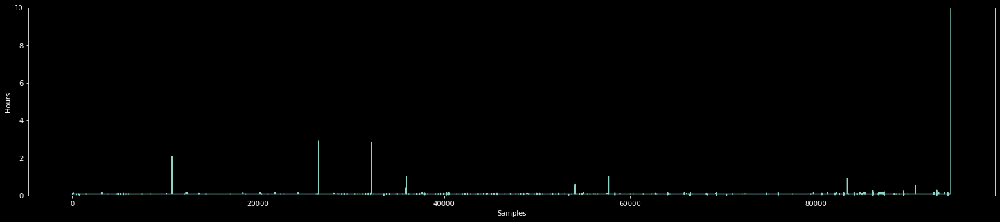

In [9]:
tdiff = test_df.reset_index().Date.diff()/pd.Timedelta('1 hour')  # get min difference between each data point
print('Average sampling rate in hours is {:.3f}'.format(np.mean(tdiff)))

plt.plot(tdiff)
plt.ylim(0,10)
plt.ylabel('Hours')
plt.xlabel('Samples')
plt.show()

## Data Setup

**Intial Setup:**
- Looking at the `data_info` dataframe we can resample the data to `1 hour` frequencies
- A lot of times the avg sampling rate gets distorted due to the failures where data gets infrequent
- This is seen more towards the end of the dataset for each well
- `full_data` is resampled to `1 hour` frequency

In [10]:
%%time
#Initial Setup
# TODO: Check which columns to drop and use for analysis
data_resampled = full_data.copy() # create a copy
data_resampled.drop(columns=['OutputAmps', 'OutputVolts', 'YVib'], inplace=True) # drop these columns
data_resampled.set_index(['NodeID', 'Date'], inplace=True)  # set index
data_resampled.dropna(how='all', inplace=True)  # drop all rows where only nans present, will reduce it even further where we drop unnecessary columns
data_resampled.reset_index(inplace=True)

# Resampling
data_resampled = data_resampled.groupby('NodeID').resample('1H', on='Date').mean()
data_resampled.reset_index(inplace=True)
data_resampled.tail(5)

Wall time: 4.43 s


,NodeID,Date,MotorCurrent,Frequency,PIP,PDP,TubingPressure,CasingPressure,PIT,MotorTemperature,XVib
356425,Wade Federal 5300 41-30 9B,2020-05-07 09:00:00,0.000000,0.000000,0.0,0.0,192.166667,53.500,0.0,0.0,0.0
356426,Wade Federal 5300 41-30 9B,2020-05-07 10:00:00,0.000000,0.000000,0.0,0.0,190.937500,6.625,0.0,0.0,0.0
356427,Wade Federal 5300 41-30 9B,2020-05-07 11:00:00,0.000000,0.000000,0.0,0.0,190.833333,0.000,0.0,0.0,0.0
356428,Wade Federal 5300 41-30 9B,2020-05-07 12:00:00,0.000000,0.000000,0.0,0.0,192.500000,0.000,0.0,0.0,0.0
356429,Wade Federal 5300 41-30 9B,2020-05-07 13:00:00,6.714286,0.857143,0.0,0.0,189.357143,0.000,0.0,0.0,0.0


In [11]:
print('-------\nNull Values(%)\n')
print(data_resampled.isnull().sum(axis=0)/len(data_resampled) * 100)

-------
Null Values(%)

NodeID               0.000000
Date                 0.000000
MotorCurrent         6.204304
Frequency            5.948433
PIP                  6.204304
PDP                  6.204304
TubingPressure      10.466291
CasingPressure       6.725584
PIT                  9.944169
MotorTemperature     6.204304
XVib                 9.944169
dtype: float64


**Transferring Labels**

- Pick a `forecasting_delta` for each failure. For now we consider `15 days`. Change this if need be.
- For each well
    - `Start Date` to (`Fail Date` - `forecasting_delta`) --> Label as `Normal`
    - (`Fail Date` - `Forecasting_delta`) to `Fail Date` --> Label as `Reason to Pull`
    - `Fail Date` to (`Fail Date` + `1 day`)  -->  Label as Actual + Reason to Pull
    - Label everythng esle as `Drop`
- Drop those wells which have Unknow as a label `for now`.
- This gives us the a labeled dataset on which we can run our analysis and implement some splitting strategies
- Use the library function: `library.esp.label_esp_data()`
- Check docstring for more info

In [12]:
%%time
esp.label_esp_data(data_resampled, 
                   failure_df, forecasting_delta='15 days',
                   verbose=1)

# Drop this line
# data_resampled['Label'] = data_resampled['Label'].map({'Nor':'Normal'}).fillna(data_resampled['Label'])


----------
Kjos Federal 5501 11-18 9BX
Label Counts
Drop              352781
Normal              3240
Unknown              361
Actual Unknown        48
Name: Label, dtype: int64

----------
Mccauley 5501 14-4 8BX
Label Counts
Drop              348316
Normal              7296
Unknown              722
Actual Unknown        96
Name: Label, dtype: int64

----------
Dawson 5494 42-12 4T
Label Counts
Drop              340328
Normal             14897
Unknown             1083
Actual Unknown       122
Name: Label, dtype: int64

----------
Jensen 5501 11-18 4B
Label Counts
Drop                     332394
Normal                    22433
Unknown                    1083
Hole in Tubing              361
Actual Unknown              122
Actual Hole in Tubing        37
Name: Label, dtype: int64

----------
Berry 5493 44-7 14BX
Label Counts
Drop                     327233
Normal                    27185
Unknown                    1444
Hole in Tubing              361
Actual Unknown              170
Actua

Label Counts
Drop                        235636
Normal                      112323
Unknown                       2166
No Production                 1805
Hole in Tubing                1444
Grounded Downhole              722
Broken Shaft                   722
Stuck Pump                     361
Grounded downhole              361
Actual Unknown                 266
Actual No Production           212
Actual Hole in Tubing          175
Actual Broken Shaft             96
Actual Grounded Downhole        73
Actual Stuck Pump               48
Actual Grounded downhole        20
Name: Label, dtype: int64

----------
Drummond 5501 42-21 5B
Label Counts
Drop                        229851
Normal                      117699
Unknown                       2527
No Production                 1805
Hole in Tubing                1444
Grounded Downhole              722
Broken Shaft                   722
Stuck Pump                     361
Grounded downhole              361
Actual Unknown                 314
Act

Label Counts
Normal                      176792
Drop                        165259
Unknown                       3971
Broken Shaft                  2166
Hole in Tubing                1805
No Production                 1805
Grounded downhole             1444
Grounded Downhole             1083
Stuck Pump                     722
Actual Unknown                 460
Actual Hole in Tubing          223
Actual No Production           212
Actual Broken Shaft            183
Actual Grounded Downhole       121
Actual Stuck Pump               96
Actual Grounded downhole        88
Name: Label, dtype: int64

----------
Seattle Federal 5200 42-35 7B
Label Counts
Normal                      180248
Drop                        161394
Unknown                       3971
Broken Shaft                  2166
No Production                 2166
Hole in Tubing                1805
Grounded downhole             1444
Grounded Downhole             1083
Stuck Pump                     722
Actual Unknown                 

Label Counts
Normal                      207848
Drop                        129415
Unknown                       4693
Broken Shaft                  3610
Hole in Tubing                2888
No Production                 2166
Grounded downhole             1805
Grounded Downhole             1444
Stuck Pump                     722
Actual Unknown                 514
Actual Hole in Tubing          358
Actual Broken Shaft            341
Actual No Production           260
Actual Grounded downhole       136
Actual Grounded Downhole       134
Actual Stuck Pump               96
Name: Label, dtype: int64

----------
Hanover Federal 5300 41-11 11T
Label Counts
Normal                      209912
Drop                        126981
Unknown                       5054
Broken Shaft                  3610
Hole in Tubing                2888
No Production                 2166
Grounded downhole             1805
Grounded Downhole             1444
Stuck Pump                     722
Actual Unknown                

Label Counts
Normal                      226495
Drop                        106436
Unknown                       5054
Broken Shaft                  3971
Grounded downhole             3610
No Production                 3249
Hole in Tubing                2888
Grounded Downhole             1805
Stuck Pump                     722
Actual Unknown                 523
Actual Broken Shaft            389
Actual Hole in Tubing          358
Actual No Production           349
Actual Grounded downhole       337
Actual Grounded Downhole       148
Actual Stuck Pump               96
Name: Label, dtype: int64

----------
Thorlaksen 11-14H
Label Counts
Normal                      227359
Drop                        105163
Unknown                       5054
Broken Shaft                  3971
Grounded downhole             3610
No Production                 3249
Hole in Tubing                2888
Grounded Downhole             2166
Stuck Pump                     722
Actual Unknown                 523
Actual B

Label Counts
Normal                      230023
Drop                         99397
Broken Shaft                  5415
Unknown                       5054
No Production                 4212
Grounded downhole             3610
Hole in Tubing                2888
Grounded Downhole             2239
Stuck Pump                     722
Actual Unknown                 523
Actual Broken Shaft            473
Actual No Production           454
Actual Hole in Tubing          358
Low Production                 337
Actual Grounded downhole       337
Actual Grounded Downhole       244
Actual Stuck Pump               96
Actual Low Production           48
Name: Label, dtype: int64

----------
Cook Federal 5300 41-12 10BX
Label Counts
Normal                      230023
Drop                         99397
Broken Shaft                  5415
Unknown                       5054
No Production                 4212
Grounded downhole             3610
Hole in Tubing                2888
Grounded Downhole             22

In [13]:
data_resampled.Label.value_counts()

Normal                      230023
Drop                         99397
Broken Shaft                  5415
Unknown                       5054
No Production                 4212
Grounded downhole             3610
Hole in Tubing                2888
Grounded Downhole             2239
Stuck Pump                     722
Actual Unknown                 523
Actual Broken Shaft            473
Actual No Production           454
Actual Hole in Tubing          358
Low Production                 337
Actual Grounded downhole       337
Actual Grounded Downhole       244
Actual Stuck Pump               96
Actual Low Production           48
Name: Label, dtype: int64

In [14]:
# plot Specific wells
general.plot_features(df=data_resampled,
                      well_name='Kaitlin Federal 5693 41-28B',
                      fail_col='Label',
                      zero_label = 'Normal',
                      feature_cols=['MotorCurrent','PIP', 'PDP', 'MotorTemperature'],
                      mov_avg=None)

**Final Cleanup**

- Drop rows with labels
    - `Drop` : Dont have info
    - `Actual Label` : Building a forecasting model so we dont need these labels
- Wells with Label `Unknown` : Keep it aside

In [15]:
final_data = data_resampled.copy()
final_data = final_data[~final_data['Label'].str.contains('Drop')]  # Dropping labels Drop
final_data = final_data[~final_data['Label'].str.contains('Actual')]  # Dropping actual failures


In [16]:
# Split unknowm labels
final_data['Split'] = 0
for i in failure_df[failure_df['Reason For Pull'] == 'Unknown'].index:    
    # get info
    well, st_dt, fail_dt, reason = failure_df.loc[i, ['NodeID', 'Start Date', 'Fail Date', 'Reason For Pull']].values
    # Boolean masl
    bool_ = (final_data['NodeID'] == well) & (final_data.Date >= st_dt) & (final_data.Date <= fail_dt)  # Condition for Normal
    # mark unknown dates as 1
    final_data.loc[bool_, 'Split'] = 1
    
data_unknown = final_data[final_data.Split == 1].copy()
data_unknown.drop(columns='Split', inplace=True)
data_unknown.reset_index(inplace=True, drop=True)

data = final_data[final_data.Split == 0].copy()
data.drop(columns='Split', inplace=True)
data.reset_index(inplace=True, drop=True)
data.Label.value_counts()

Normal               170445
Broken Shaft           5415
No Production          4212
Grounded downhole      3610
Hole in Tubing         2888
Grounded Downhole      2239
Stuck Pump              722
Low Production          337
Name: Label, dtype: int64

In [17]:
# Dropping 'Stuck Pump' and 'Low Production'

cl_drop = ['Stuck Pump', 'Low Production']

data['Split'] = 0
for i in failure_df[failure_df['Reason For Pull'].isin(cl_drop)].index:
    # get info
    well, st_dt, fail_dt, reason = failure_df.loc[i, ['NodeID', 'Start Date', 'Fail Date', 'Reason For Pull']].values
    # Boolean masl
    bool_ = (data['NodeID'] == well) & (data.Date >= st_dt) & (data.Date <= fail_dt)  # Condition for Normal
    # mark cl_drop wells as 1
    data.loc[bool_, 'Split'] = 1

data = data[data.Split == 0]
data.drop(columns = ['Split'], inplace=True)
data.reset_index(inplace=True, drop=True)
data.Label.value_counts()

Normal               162789
Broken Shaft           5415
No Production          4212
Grounded downhole      3610
Hole in Tubing         2888
Grounded Downhole      2239
Name: Label, dtype: int64

In [18]:
# plot Specific wells
general.plot_features(df=data,
                      well_name='Dawson 5494 41-12 2T',
                      fail_col='Label',
                      zero_label = 'Normal',
                      feature_cols=['MotorCurrent','PIP', 'PDP'],
                      mov_avg='7D')

# plot Specific wells
print('Unkown Split')
general.plot_features(df=data_unknown,
                      well_name='Dawson 5494 41-12 2T',
                      fail_col='Label',
                      zero_label = 'Normal',
                      feature_cols=['MotorCurrent','PIP', 'PDP'],
                      mov_avg='7D')

Unkown Split


In [19]:
# some label cleanups
data['Label'] = data['Label'].map({'Grounded downhole':'Grounded Downhole'}).fillna(data['Label'])
data.Label.value_counts()

Normal               162789
Grounded Downhole      5849
Broken Shaft           5415
No Production          4212
Hole in Tubing         2888
Name: Label, dtype: int64

# Feature Importance

- Identify which features are important for building a model.
- In addition also identify which 

####  TODO

# Splitting the Data

The following strategies have been identified for splitting the data:

**Shuffle Split**
- Use the `train_test_split` funtion from `sklearn,preprocessing`
- This will lead to overfitting 
- Will give much better results than what we may see in real-time

**Split By well**
- Split the data by wells
- Both train and test shoul include all the failures
- This method will be preferred
- Good results here will imply the algo can be generalized for differenet wells
- Will also tell us whether our Normalizing strategy works
- Should work really well for real-time data
- Use function `split_by_well`

**Time Series Split**
- Split the data by time
- Best method for gerneralizing the model and avoid overfitting
- Hoever for our current dataset this will not work as most of the failures are occurring in the end

In [20]:
def split_by_well(dataset, no_of_wells, fail_col='Label', well_col='NodeID', zero_label='Normal', random_state=42, verbose=0):
    """
    Split by well
    --------------
    - Splits the dataFrame into and train and test
    - Entire wells are split accorind to the failures in fail Column
    - First we identify well ditribution in each type of failure
    - The we keep some group of wells aside for testing Such that all failuress are represented in both train and test dataframes
    TODO: Maybe add a unique well features
    
    Parameters
    --------------------
    :param dataset: The dataframe that needs to be split
    :param no_of_wells: Number of wells from each class in the test dataset
    :param fail_col: The Column in the dataset which has the labels/failure labels
    :param well_col: The Column which has well names
    :param zero_label: The label which defines the normal working condition
    :param random_state: Default 42
    :param verbose: 0 for not printing anything
    """
    vprint = print if verbose != 0 else lambda *a, **k: None  # add verbose condition
    random.seed = random_state

    # get failure distribution
    fail_dist = dataset.groupby(fail_col)[well_col].agg(['unique'])

    test_wells = np.array([]) # initialize empty array
    for i in fail_dist.index:
        # skip for normal
        if i == zero_label:
            continue
            
        # get unique list of wells in specific failure
        temp_list = fail_dist.loc[i]['unique']  
        if len(temp_list) <= no_of_wells:
            raise Exception(f'Not enough wells to split for Failure: {i} which has just {len(temp_list)} wells')
        
        well_names = [x for x in random.sample(set(temp_list), no_of_wells)]  # get n random sample of wells from that list 
        test_wells = np.append(test_wells, well_names, axis=0) # append it to main test array

    test = dataset[dataset[well_col].isin(test_wells)].copy()
    test.reset_index(inplace=True, drop=True)

    train = dataset[~dataset[well_col].isin(test_wells)].copy()
    train.reset_index(inplace=True, drop=True)

    vprint('Label Distribution:\n----------')
    vprint(pd.concat([train.Label.value_counts(),test.Label.value_counts()], keys=['Train', 'Test'],axis=1))
    
    vprint('\nWells Used in Test-Set:\n---------', *test_wells, sep='\n')
    
    vprint("\nNAN value Distribution in %:\n-------------")
    vprint(pd.concat([train.isnull().sum(axis=0)/ len(train), test.isnull().sum(axis=0)/ len(test)], keys=['Train', 'Test'], axis=1).round(4) * 100)
    
    return train, test

# Normalizing the data

A very important task will be on identifying how we normalize the data:

**Technique1**
- Normalize the data on the entire dataset. (This will include all wells and all datapoints)
- Once the scaler is trained. Save it and use it whenever needed

**Tehnique2**
- If data can be grouped either by wells or by the pump type.
- Build and save different scaler for each group.
- In production, use the scaler which is needed for each group.

**Technique3**
- Build a custom scaling funcntion in a well specifc basis
- This will save the max/min values for each KPI
- And while scaling will pull the correct max/min to scale the data or build a scaler

In [21]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, Normalizer

In [22]:
data.head()

,NodeID,Date,MotorCurrent,Frequency,PIP,PDP,TubingPressure,CasingPressure,PIT,MotorTemperature,XVib,Label
0,Berry 5493 41-7 6B,2019-08-19 00:00:00,22.954545,62.627273,665.500000,3805.454545,104.090909,106.727273,243.363636,266.000000,3.727273,Normal
1,Berry 5493 41-7 6B,2019-08-19 01:00:00,23.440000,58.680000,675.530000,3839.600000,121.200000,106.600000,243.000000,265.900000,3.500000,Normal
2,Berry 5493 41-7 6B,2019-08-19 02:00:00,25.227273,60.936364,665.472727,3863.363636,114.727273,108.000000,242.181818,265.636364,3.818182,Normal
3,Berry 5493 41-7 6B,2019-08-19 03:00:00,22.711111,58.988889,660.933333,3700.000000,123.333333,108.000000,242.666667,265.888889,3.666667,Normal
4,Berry 5493 41-7 6B,2019-08-19 04:00:00,23.270000,62.600000,651.390000,3887.300000,110.200000,108.000000,242.300000,265.400000,4.000000,Normal


In [23]:
"""
Normalize each well seperately
-----------
Picking a group of features to reduce the numbver of datapoints to drop cause of NAN values
"""
cols_to_norm = ['MotorCurrent', 'Frequency', 'PIP', 'PDP', 'TubingPressure', 'CasingPressure', 'PIT', 'MotorTemperature', 'XVib']

frames = []
for well in data.NodeID.unique():
    temp_scaler = MinMaxScaler()  # initialize scaler
    temp_df = data[data.NodeID == well].copy()  # get well df
    temp_df.dropna(how='any', subset=cols_to_norm, inplace=True)  # drop nans only where norm col rows are nan
    temp_df.reset_index(inplace=True, drop=True)
    try:
        scaled_arr = temp_scaler.fit_transform(temp_df[cols_to_norm])  # scale the data points
    except ValueError:
        print(f'Values Dropped in well: {well}')
        continue
    
    scaled_temp_df = pd.DataFrame(data=scaled_arr, columns=cols_to_norm)
    scaled_temp_df = pd.concat([temp_df[['NodeID', 'Date', 'Label']], scaled_temp_df], axis=1)
    frames.append(scaled_temp_df)
    del temp_df, scaled_arr, scaled_temp_df, temp_scaler
    
data_scaled = pd.concat(frames)
data_scaled.reset_index(inplace=True, drop=True)
data_scaled.head()

Values Dropped in well: Jensen 5501 43-7 6B
Values Dropped in well: Spratley 5494 34-13 11T


,NodeID,Date,Label,MotorCurrent,Frequency,PIP,PDP,TubingPressure,CasingPressure,PIT,MotorTemperature,XVib
0,Berry 5493 41-7 6B,2019-08-19 00:00:00,Normal,0.681818,0.963497,0.501020,0.810037,0.387099,0.417992,0.252539,0.471022,0.182197
1,Berry 5493 41-7 6B,2019-08-19 01:00:00,Normal,0.696238,0.902769,0.517506,0.818544,0.450725,0.417493,0.246594,0.469758,0.170833
2,Berry 5493 41-7 6B,2019-08-19 02:00:00,Normal,0.749325,0.937483,0.500976,0.824464,0.426654,0.422977,0.233218,0.466424,0.186742
3,Berry 5493 41-7 6B,2019-08-19 03:00:00,Normal,0.674587,0.907521,0.493515,0.783763,0.458659,0.422977,0.241144,0.469617,0.179167
4,Berry 5493 41-7 6B,2019-08-19 04:00:00,Normal,0.691188,0.963077,0.477829,0.830428,0.409818,0.422977,0.235150,0.463435,0.195833


In [24]:
"""
Normalize the Entire Dataset
-----------
- Picking a group of features to reduce the numbver of datapoints to drop cause of NAN values
- Normalize the Whole Dataset at the start
- The scaler used to fit and transform the data will hve to be saved to use it in production
"""
data_temp = data.copy()

# define scaler
full_scaler = MinMaxScaler()

# setup
data_temp.set_index(['NodeID', 'Date'], inplace=True)
data_temp.dropna(inplace=True)

# extrativing labels
full_labels = data_temp.pop('Label')

# scaling
data_scaled_full = pd.DataFrame(data=full_scaler.fit_transform(data_temp), index=data_temp.index, columns=data_temp.columns)
data_scaled_full = pd.concat([data_scaled_full, full_labels], axis=1)
data_scaled_full.reset_index(inplace=True)
del data_temp

data_scaled_full.head()

,NodeID,Date,MotorCurrent,Frequency,PIP,PDP,TubingPressure,CasingPressure,PIT,MotorTemperature,XVib,Label
0,Berry 5493 41-7 6B,2019-08-19 00:00:00,0.120973,0.963497,0.132227,0.682348,0.090331,0.035576,0.494809,0.732446,0.008668,Normal
1,Berry 5493 41-7 6B,2019-08-19 01:00:00,0.123531,0.902769,0.134220,0.688471,0.105178,0.035533,0.494070,0.732171,0.008140,Normal
2,Berry 5493 41-7 6B,2019-08-19 02:00:00,0.132950,0.937483,0.132222,0.692732,0.099561,0.036000,0.492406,0.731445,0.008879,Normal
3,Berry 5493 41-7 6B,2019-08-19 03:00:00,0.119690,0.907521,0.131320,0.663439,0.107029,0.036000,0.493392,0.732140,0.008527,Normal
4,Berry 5493 41-7 6B,2019-08-19 04:00:00,0.122635,0.963077,0.129424,0.697023,0.095632,0.036000,0.492647,0.730794,0.009302,Normal


# Forecasting Algorithms

## Baseline
- Model: A pipeline with a scaler and rfc
- No aggregation in the data
- Drop NAN's
- Don't shuffle the train data

Looking at the NAN Distribution in the training data we drop the following columns
- TubingPressure
- PIT
- XVib

In [29]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler
# Metrics
# Imports for metrics
from sklearn.metrics import precision_recall_fscore_support, f1_score, recall_score, precision_score
from sklearn.metrics import jaccard_score, hamming_loss, classification_report, confusion_matrix

In [30]:
# helper functions
def get_agg(df, freq, time_col='Date', well_col = 'NodeID'):
    
    frames = []
    
    for well in df[well_col].unique():
        temp_df = df[df[well_col] == well].copy()
        temp_df.set_index(time_col, inplace=True)
        temp_df = temp_df.rolling(freq).mean()
#         temp_df = temp_df.add_prefix(freq+'_')
        temp_df[well_col] = well
        temp_df.reset_index(inplace=True)
        frames.append(temp_df)
        
    rolled_df = pd.concat(frames)
    rolled_df.reset_index(inplace=True, drop=True)
    
    return rolled_df

# Quick Metrics
def quick_metrics(y_true, y_predicted, classes):
    # Weighted
    sc = np.array(precision_recall_fscore_support(y_true, y_predicted, average='weighted'), \
                  dtype=np.float32).round(4) * 100
    print('Weighted Metrics')
    print('Precision : {:.2f}\nRecall: {:.2f}\nF-score: {:.2f}'.format(sc[0], sc[1], sc[2]))

    # macro
    print('\nMacro Metrics')
    sc_macro = np.array(precision_recall_fscore_support(y_true, y_predicted, average='macro'), \
                        dtype=np.float32).round(4) * 100
    print('Precision : {:.2f}\nRecall: {:.2f}\nF-score: {:.2f}'.format(sc_macro[0], sc_macro[1], sc_macro[2]))

    # Classification Report
    print("\nClassification Report")
    print(classification_report(y_true, 
                                y_predicted, 
                                target_names = classes))
    return None

# Simple model testing function
def simple_model_test(train_data, test_data, cols, model, label_col='Label', agg=None):
    print('\n------------------')
    if agg is not None:
        # Aggregate the data
        train = pd.concat([get_agg(train_data, freq=agg).set_index(['NodeID', 'Date']), train_data.set_index(['NodeID', 'Date'])[label_col]], axis=1)
        test = pd.concat([get_agg(test_data, freq=agg).set_index(['NodeID', 'Date']), test_data.set_index(['NodeID', 'Date'])[label_col]], axis=1)
        print(f'Aggregation of {agg} Done')
    else:
        train = train_data.copy()
        test = test_data.copy()

    # get training data
    X_train = (train[cols].copy()
               .dropna() # dropna
               .sample(frac=1)  # shuffle
               .reset_index(drop=True))
    y_train = X_train.pop(label_col)

    # get testing data
    X_test = (test[cols].copy()
              .dropna()
              .reset_index(drop=True))
    y_test = X_test.pop(label_col)

    # fit the model
    model.fit(X_train, y_train)
    print("Model Trained")
    y_pred = model.predict(X_test)
    print("Predictions Done\n")
    # metrics
    if issubclass(model.classes_.dtype.type, np.integer):
        cl = None
    else:
        cl = model.classes_
    
    quick_metrics(y_test, y_pred, cl)
    
    return model

# plot feature importance
def plot_feature_importance(model, features):
    importances = model.feature_importances_
    indices = np.argsort(importances)

    plt.title('Feature Importances')
    plt.barh(range(len(indices)), importances[indices], align='center')
    plt.yticks(range(len(indices)), [features[i] for i in indices])
    plt.xlabel('Relative Importance')
    plt.show()

In [536]:
"""
Get Baseline Metrics
-----------------
- ExtraTreeCkassifier
- Standard Scaler
- All classes together
- All columns
"""
# Split the data
train_data, test_data = split_by_well(data, no_of_wells=2, verbose=1)

Label Distribution:
----------
                    Train   Test
Normal             138663  24126
Grounded Downhole    5127    722
Broken Shaft         4693    722
No Production        3490    722
Hole in Tubing       2166    722

Wells Used in Test-Set:
---------
Kjorstad 5300 34-22 9B
Kaitlin Federal 5693 41-28B
Om Erickson 5501 11-18 4B
Spratley 5494 44-13 6T
Lewis Federal 5300 21-31 5B
Kjos Federal 5501 11-18 9BX
Lite 5393 31-11 10T
Lewis Federal 5300 11-31 4BR

NAN value Distribution in %:
-------------
                  Train   Test
NodeID             0.00   0.00
Date               0.00   0.00
MotorCurrent       2.92   3.66
Frequency          2.33   3.66
PIP                2.92   3.66
PDP                2.92   3.66
TubingPressure    10.37  16.79
CasingPressure     4.12   3.66
PIT                9.17  16.78
MotorTemperature   2.92   3.66
XVib               9.17  16.78
Label              0.00   0.00



------------------
Model Trained
Predictions Done



c:\users\rai_v\onedrive\python coursera\oasis\venv\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Weighted Metrics
Precision : 81.78
Recall: 87.16
F-score: 81.47

Macro Metrics
Precision : 52.75
Recall: 20.68
F-score: 20.02

Classification Report
                   precision    recall  f1-score   support

     Broken Shaft       0.53      0.01      0.02       720
Grounded Downhole       1.00      0.01      0.02       710
   Hole in Tubing       0.00      0.00      0.00       721
    No Production       0.23      0.02      0.03       720
           Normal       0.87      1.00      0.93     19608

         accuracy                           0.87     22479
        macro avg       0.53      0.21      0.20     22479
     weighted avg       0.82      0.87      0.81     22479



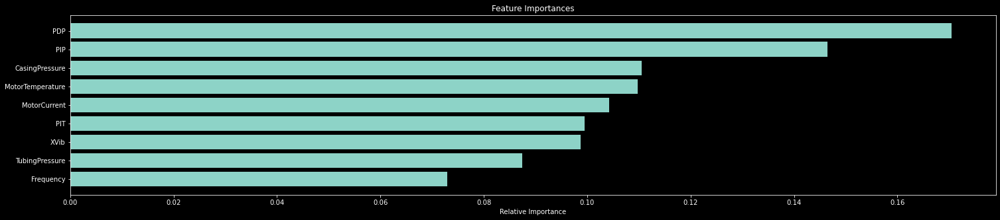

In [570]:
feature_cols = ['MotorCurrent', 'Frequency', 'PIP', 'PDP', 'TubingPressure', 'CasingPressure', 'PIT', 'MotorTemperature', 'XVib', 'Label']
# feature_cols = ['MotorCurrent', 'PIP', 'PDP', 'MotorTemperature', 'CasingPressure', 'Label']
# Model
scaler = MinMaxScaler() # Define Scaler
et_params ={ 'class_weight': 'balanced', 'verbose': 0}
et = ExtraTreesClassifier(**et_params)
baseline_model = Pipeline([
    ('scaler', scaler),
    ('etc', et)
])

# Test
trained_model =  simple_model_test(train_data, test_data, cols=feature_cols, model=baseline_model, label_col='Label', agg=None)

plot_feature_importance(trained_model[1], feature_cols)


------------------
Model Trained
Predictions Done

Weighted Metrics
Precision : 82.34
Recall: 87.24
F-score: 81.52

Macro Metrics
Precision : 56.18
Recall: 20.73
F-score: 20.10

Classification Report
                   precision    recall  f1-score   support

     Broken Shaft       0.65      0.02      0.04       720
Grounded Downhole       1.00      0.01      0.02       710
   Hole in Tubing       0.00      0.00      0.00       721
    No Production       0.29      0.01      0.02       720
           Normal       0.87      1.00      0.93     19608

         accuracy                           0.87     22479
        macro avg       0.56      0.21      0.20     22479
     weighted avg       0.82      0.87      0.82     22479



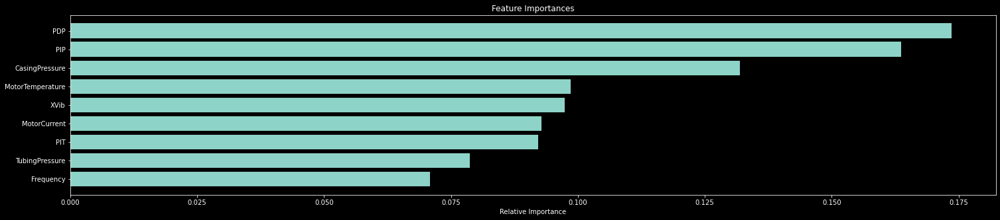

In [571]:
"""
Model 1
-----
- StandardScaler
- RFC
- All classes together
- All columns
"""
feature_cols = ['MotorCurrent', 'Frequency', 'PIP', 'PDP', 'TubingPressure', 'CasingPressure', 'PIT', 'MotorTemperature', 'XVib', 'Label']
# feature_cols = ['MotorCurrent', 'PIP', 'PDP', 'MotorTemperature', 'CasingPressure', 'Label']
# Model
scaler = MinMaxScaler() # Define Scaler
# RFC Params
rfc_params = {
    'n_estimators': 100,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'class_weight': 'balanced',
    'verbose': 0,
    'max_features': 'auto',
    'max_depth': None,
}
# RFC Classifier
rfc = RandomForestClassifier(**rfc_params)
baseline_model = Pipeline([
    ('scaler', scaler),
    ('rfc', rfc)
])

# Test
trained_model =  simple_model_test(train_data, test_data, cols=feature_cols, model=baseline_model, label_col='Label', agg=None)

plot_feature_importance(trained_model[1], feature_cols)

In [558]:
"""
Model 2
------
- ExtraTreeClassifier
- Using Prescaled Data
"""
train_scaled, test_scaled = split_by_well(data_scaled, no_of_wells=2, verbose=1)

Label Distribution:
----------
                    Train   Test
Normal             130950  25567
Broken Shaft         4617    719
Grounded Downhole    4360    721
No Production        3408    602
Hole in Tubing       2157    719

Wells Used in Test-Set:
---------
Kjorstad 5300 34-22 9B
Berry 5493 44-7 14BX
Berry 5493 42-7 8T
Spratley 5494 34-13 11T
Lewis Federal 5300 21-31 5B
Jensen 5501 43-7 6B
Lite 5393 11-11 3BX
Seattle Federal 5200 42-35 7B

NAN value Distribution in %:
-------------
                  Train  Test
NodeID              0.0   0.0
Date                0.0   0.0
Label               0.0   0.0
MotorCurrent        0.0   0.0
Frequency           0.0   0.0
PIP                 0.0   0.0
PDP                 0.0   0.0
CasingPressure      0.0   0.0
MotorTemperature    0.0   0.0



------------------
Model Trained
Predictions Done

Weighted Metrics
Precision : 81.96
Recall: 90.17
F-score: 85.63

Macro Metrics
Precision : 21.70
Recall: 20.09
F-score: 19.19

Classification Report
                   precision    recall  f1-score   support

     Broken Shaft       0.18      0.01      0.01       719
Grounded Downhole       0.00      0.00      0.00       721
   Hole in Tubing       0.00      0.00      0.00       719
    No Production       0.00      0.00      0.00       602
           Normal       0.90      1.00      0.95     25567

         accuracy                           0.90     28328
        macro avg       0.22      0.20      0.19     28328
     weighted avg       0.82      0.90      0.86     28328



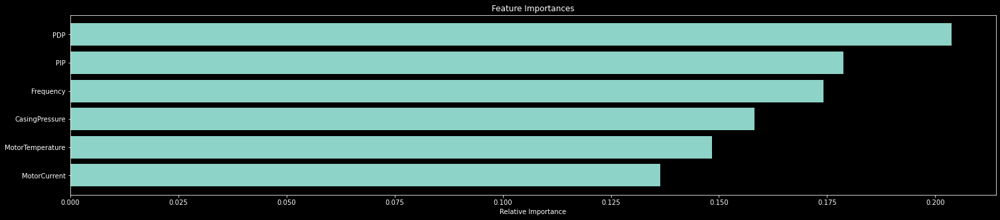

In [560]:
feature_cols = ['MotorCurrent', 'Frequency', 'PIP', 'PDP', 'CasingPressure', 'MotorTemperature', 'Label']
# feature_cols = ['MotorCurrent', 'PIP', 'PDP', 'MotorTemperature', 'CasingPressure', 'Label']
# Model
et_params ={ 'class_weight': 'balanced', 'verbose': 0}
model_2 = ExtraTreesClassifier(**et_params)

# Test
trained_model =  simple_model_test(train_scaled, test_scaled, cols=feature_cols, model=model_2, label_col='Label', agg=None)

plot_feature_importance(model_2, feature_cols)

# Failure Specific Models

- Initially we ll only test out different models on the wells which have similar types of failures
- If this gives good results we can extrapolate it to include other wells too


In [572]:
failure_distribution = data.groupby('Label')['NodeID'].agg(['unique'])
display(failure_distribution)

display(data.Label.value_counts())

,unique
Label,
Broken Shaft,"[Berry 5493 41-7 6B, Berry 5493 44-7 14BX, Ber..."
Grounded Downhole,"[Berry 5493 42-7 8T, Crane Federal 5300 14-27 ..."
Hole in Tubing,"[Drummond 5501 41-21 7B, Jensen 5501 11-18 4B,..."
No Production,"[Berry 5493 42-7 9B, Crane Federal 5300 14-27 ..."
Normal,"[Berry 5493 41-7 6B, Berry 5493 42-7 8T, Berry..."


Normal               162789
Grounded Downhole      5849
Broken Shaft           5415
No Production          4212
Hole in Tubing         2888
Name: Label, dtype: int64

## Grounded Downhole

In [704]:
failure_type = 'Grounded Downhole'
dataset = data.copy()

failure_distribution = dataset.groupby('Label')['NodeID'].agg(['unique'])
wells = failure_distribution.loc[failure_type]['unique']  # list of wells that have grounded downhole as a failure

print(f'No of wells in with this failure {len(wells)}')
data_gd = dataset[dataset.NodeID.isin(wells)].copy()
data_gd.reset_index(inplace=True, drop=True)
print("Actual Label Distribution:")
display(data_gd.Label.value_counts())

# CReate binary labels 1 - Specific failure, 0 - Everything else
data_gd['LabelBin'] = data_gd['Label'].map(lambda x: failure_type if x == failure_type else 'Normal' )
print("Binary Labels: ")
display(data_gd['LabelBin'].value_counts())

No of wells in with this failure 17
Actual Label Distribution:


Normal               60468
Grounded Downhole     5849
Hole in Tubing         722
No Production          722
Name: Label, dtype: int64

Binary Labels: 


Normal               61912
Grounded Downhole     5849
Name: LabelBin, dtype: int64

In [705]:
# Using well split to split the data
train_gd, test_gd = split_by_well(data_gd, 
                                  no_of_wells=2,  # change this number
                                  fail_col='LabelBin', 
                                  zero_label=0, 
                                  random_state=55, 
                                  verbose=1)

Label Distribution:
----------
                   Train     Test
Normal             45204  15264.0
Grounded Downhole   4405   1444.0
No Production        722      NaN
Hole in Tubing       361    361.0

Wells Used in Test-Set:
---------
Mccauley 5601 41-34 6B
Lite 5393 41-11 11B
Spratley 5494 44-13 6T
Jensen 5501 43-7 5B

NAN value Distribution in %:
-------------
                  Train   Test
NodeID             0.00   0.00
Date               0.00   0.00
MotorCurrent       4.77   2.85
Frequency          2.99   2.85
PIP                4.77   2.85
PDP                4.77   2.85
TubingPressure     8.42  13.59
CasingPressure     4.77  13.49
PIT                8.42   2.94
MotorTemperature   4.77   2.85
XVib               8.42   2.94
Label              0.00   0.00
LabelBin           0.00   0.00



------------------
Aggregation of 15D Done
Model Trained
Predictions Done

Weighted Metrics
Precision : 86.44
Recall: 92.85
F-score: 89.53

Macro Metrics
Precision : 46.48
Recall: 49.93
F-score: 48.15

Classification Report
                   precision    recall  f1-score   support

Grounded Downhole       0.00      0.00      0.00      1083
           Normal       0.93      1.00      0.96     14338

         accuracy                           0.93     15421
        macro avg       0.46      0.50      0.48     15421
     weighted avg       0.86      0.93      0.90     15421



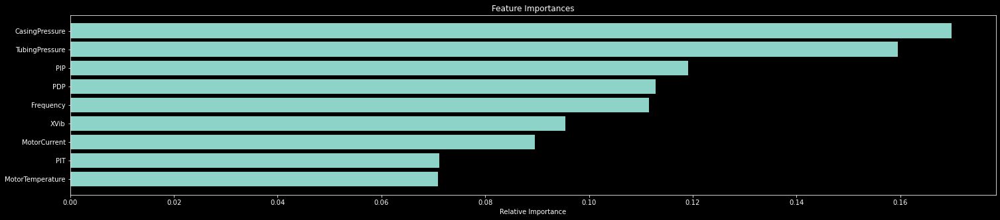

In [706]:
# feature_columns = ['TubingPressure', 'CasingPressure','MotorCurrent','MotorTemperature','PIP','PDP','PIT','XVib', 'LabelBin']
feature_cols = ['MotorCurrent', 'Frequency', 'PIP', 'PDP', 'TubingPressure', 'CasingPressure', 'PIT', 'MotorTemperature', 'XVib', 'LabelBin']
# feature_cols = ['PIP', 'TubingPressure', 'XVib', 'LabelBin']

# Model
scaler = MinMaxScaler() # Define Scaler
# et_params ={ 'class_weight': 'balanced', 'verbose': 0}
et_params = {'verbose': 0}
et = ExtraTreesClassifier(**et_params)
model_fail = Pipeline([
    ('scaler', scaler),
    ('etc', et)
])

# Test
trained_model =  simple_model_test(train_gd, test_gd, cols=feature_cols, model=model_fail, label_col='LabelBin', agg='15D')

plot_feature_importance(trained_model[1], feature_cols)

In [670]:
# Testing oversampling
from imblearn.over_sampling import SMOTE, SVMSMOTE, BorderlineSMOTE


# Aggregate the data
train = pd.concat([get_agg(train_gd, freq='15D').set_index(['NodeID', 'Date']), train_gd.set_index(['NodeID', 'Date'])['LabelBin']], axis=1)
test = pd.concat([get_agg(test_gd, freq='15D').set_index(['NodeID', 'Date']), test_gd.set_index(['NodeID', 'Date'])['LabelBin']], axis=1)

# get training data
X_train = (train[feature_cols].copy()
           .dropna() # dropna
           .sample(frac=1)  # shuffle
           .reset_index(drop=True))
y_train = X_train.pop('LabelBin')

# get testing data
X_test = (test[feature_cols].copy()
          .dropna()
          .reset_index(drop=True))
y_test = X_test.pop('LabelBin')

In [671]:
sm = BorderlineSMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [672]:
# Model
scaler = StandardScaler() # Define Scaler
et_params ={ 'class_weight': 'balanced', 'verbose': 0}
# et_params = {'verbose': 0}
et = ExtraTreesClassifier(**et_params)
model_res = Pipeline([
    ('scaler', scaler),
    ('etc', et)
])

In [673]:
model_res.fit(X_res, y_res)

Pipeline(steps=[('scaler', StandardScaler()),
                ('etc', ExtraTreesClassifier(class_weight='balanced'))])

In [674]:
y_pred = model_res.predict(X_test)
y_prob = model_res.predict_proba(X_test)

In [679]:
y_

0              Normal
1              Normal
2              Normal
3              Normal
4              Normal
             ...     
21569    Broken Shaft
21570    Broken Shaft
21571    Broken Shaft
21572    Broken Shaft
21573    Broken Shaft
Name: LabelBin, Length: 21574, dtype: object

In [676]:
np.unique(y_pred, return_counts=True)

(array(['Broken Shaft', 'Normal'], dtype=object),
 array([   24, 21550], dtype=int64))

In [677]:
quick_metrics(y_test, y_pred, None)

Weighted Metrics
Precision : 89.25
Recall: 88.39
F-score: 83.05

Macro Metrics
Precision : 92.11
Recall: 50.45
F-score: 47.82

Classification Report
              precision    recall  f1-score   support

Broken Shaft       0.96      0.01      0.02      2527
      Normal       0.88      1.00      0.94     19047

    accuracy                           0.88     21574
   macro avg       0.92      0.50      0.48     21574
weighted avg       0.89      0.88      0.83     21574



# Segmentation Based Forecasting

In [25]:
def create_segments_clean(dataframe, seg_size, overlap, feature_col, label_col):
    """
    Segment the dataframe which has a constant sampling rate with a segment size
    of seg_size.
    :param dataframe: The timeseries df with constant frequency which needs to be segmented
    :param seg_size: The number of datapoints in a segment
    :param overlap: Fraction which says how much % of consecutive segments should be different
    :param feature_col: Which Features to use for creating segments (works for multivariate)
    :param label_col: Column name to use for labelling the segments
    
    Some Assumptions:
    Adding Labels:
    - In a segment even if one datapoint is labelled as a failure that segment is labelled as a failure
    - In a failure seg, if the last data-point is 'Normal' that will be dropped
    - Segemnts with 'Drop' in the label col will be dropped. 
    - This will happen even if the segment has a single drop label. 
    - While marking drop in the labels take this into account
    """
    valid_seg = []  # initialize empty valid segments array
    valid_seg_time = []  # initialize empty timestamp 
    valid_seg_labels = []  # Initialize empty label segments
    t0_old = 0
    
    for t0 in dataframe.index:
        # Overlap handling
        # go to next iteration if t0 - t0_old (current index - the previous one) is less than how much timedelta in overlap
        if (t0 != 0) & ((t0 - t0_old) < (seg_size * overlap)):  
            continue
            
        tn = t0 + seg_size  # index + seq_size
        seg = dataframe.loc[t0:tn-1, feature_col].dropna().values  # get the seg and drop nan values
        labels = dataframe.loc[t0:tn-1, label_col].values  # Get list of labels
        dates = dataframe.loc[t0:tn-1, 'Date'].values  # get dates
        
        # check if length of seg is = seg_size
        # Will take care of dropping missing values
        if len(seg) == seg_size:
            # Label Handling
            # Skip those segments which have 'Drop' in any datapoints
            if 'Drop' in labels: 
                continue 
            # if all labels are normal seg_label will be 'Normal'
            elif all(x == 'Normal' for x in labels):  
                seg_label = 'Normal'
            # contains a label other than 'Normal'
            else:
                seg_label = [x for x in labels if x != 'Normal']
                seg_label = np.unique(seg_label)[0]
            # If failure seg and last val is 'Normal' drop the segment
            if (seg_label != 'Normal') & (labels[-1] == 'Normal'):
                continue
#             print(f'Length of Segment: {len(seg)}\tLength of Vals {len(vals)}\tWith Label {seg_label}')
            valid_seg.append(seg)  # append the valid segments to the valid seg array
            valid_seg_time.append(dates)  # append dates
            valid_seg_labels.append(seg_label)  # append labels
            
        t0_old = t0  # will be used for overlap handling
        
        
    valid_seg = np.array(valid_seg)
    valid_seg_time = np.array(valid_seg_time)
    valid_seg_labels = np.array(valid_seg_labels)
    
    return valid_seg, valid_seg_labels, valid_seg_time

def nested_dataframe_from_3d_array(X):
    """
    Convert numpy array with shape (n_instance, n_timepoints, n_features)
    into a pandas DataFrame (with timeseries as pandas Series in cells)
    :param X: NumPy ndarray, input
    :returns pandas DataFrame
    """
    dataframe = pd.DataFrame()
    n_instances = X.shape[0]
    n_variables = X.shape[2]
    
    for variable in range(n_variables):
        dataframe['var_' + str(variable)] = [pd.Series(X[instance, :, variable]) for instance in range(n_instances)]
    
    return dataframe

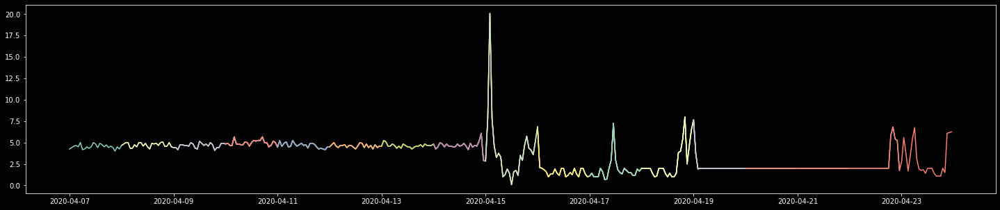

In [26]:
"""
Test the segmentation function
"""
test_df = data[data.NodeID == 'Berry 5493 41-7 6B'].copy()
test_df.reset_index(inplace=True, drop=True)

segment, segment_label, segment_dates = create_segments_clean(test_df, seg_size=96, overlap=0.25, feature_col = ['XVib'], label_col='Label')

for i in range(len(segment)):
    x1 = segment[i,:, 0]
    t = segment_dates[i]
    l = segment_label[i]
    if l != 'Normal':
        plt.plot(t,x1)
    
plt.show()

## Segmentation Algo Test

**Pre-processing**
- Scale the whole dataset (use: `data_scaled_full`)
- Segment size of 96 hrs
- Get segments and create a nested df
- Use all failures 
- Using train-test-split instead of wells split (Change this)

**Algos Being Testes**
- MRSEQL()


In [53]:
def create_merged_nested_df(dataframe, feature_col, label_col, seg_size, overlap, verbose=0):
    vprint = print if verbose != 0 else lambda *a, **k: None  # add verbose condition
    
    # Creating segments for all wells
    all_segments = []
    all_labels = []
    c = 0
    # Iterate over each well
    for well in dataframe.NodeID.unique():
        vprint(f'----------\nWell No: {c}')
        vprint(well)
        df = dataframe[dataframe.NodeID == well].copy()
        df = df.drop(columns='NodeID').dropna()  # only drop nulls for features you wanna use going ahead
        df.reset_index(inplace=True, drop=True)

        # get segments and labels
        # TODO: Play around with these parameters, try taking bigger segment lengths
        segment, label, times = create_segments_clean(df, seg_size=seg_size, overlap=overlap, feature_col = feature_col, label_col=label_col)

        if len(segment) == 0:
            vprint("No Valid Segments Found")
            continue

        # create df
        seg_df = nested_dataframe_from_3d_array(segment)
        label = pd.Series(label)

        all_segments.append(seg_df)
        all_labels.append(label)

        # While testing
        vprint(f'Total Instances {len(label)}')
        vprint(label.value_counts())
        c=c+1
    
    nested_df = pd.concat(all_segments)
    nested_df.reset_index(drop=True, inplace=True)

    segment_labels = pd.concat(all_labels)
    segment_labels.reset_index(drop=True, inplace=True)
    
    vprint('\n----------')
    print(pd.DataFrame(segment_labels.value_counts(), columns=['Counts']))
    
    return nested_df, segment_labels

### Algos

In [1]:
from sklearn.model_selection import train_test_split
from sktime.classification.shapelet_based import MrSEQLClassifier

### MrSEQL

**Splitting using Train-Test-Split**

In [ ]:
# create the entire segmented df
feature_cols = ['MotorCurrent','Frequency','PIP','PDP','TubingPressure','CasingPressure','PIT','MotorTemperature','XVib']

full_nested_df, full_nested_label = create_merged_nested_df(data_scaled_full, 
                                                            feature_col=feature_cols, 
                                                            label_col='Label', 
                                                            seg_size=96, 
                                                            overlap=0.25, 
                                                            verbose=1)

In [31]:
# Simple train-test-split
X_train, X_test, y_train, y_test = train_test_split(full_nested_df, full_segment_labels, random_state=42, stratify=segment_labels)

print("Train Counts:")
display(y_train.value_counts())

print("Test Counts:")
display(y_test.value_counts())

Train Counts:


Normal               4377
Broken Shaft          168
Grounded Downhole     144
No Production         124
Hole in Tubing         79
dtype: int64

Test Counts:


Normal               1459
Broken Shaft           56
Grounded Downhole      48
No Production          42
Hole in Tubing         26
dtype: int64

In [32]:
clf = MrSEQLClassifier()
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9742489270386266

In [33]:
y_pred = clf.predict(X_test)

In [34]:
quick_metrics(y_test, y_pred, clf.classes_)

Weighted Metrics
Precision : 97.46
Recall: 97.42
F-score: 97.27

Macro Metrics
Precision : 98.41
Recall: 81.26
F-score: 88.70

Classification Report
                   precision    recall  f1-score   support

     Broken Shaft       1.00      0.77      0.87        56
Grounded Downhole       0.95      0.75      0.84        48
   Hole in Tubing       1.00      0.81      0.89        26
    No Production       1.00      0.74      0.85        42
           Normal       0.97      1.00      0.99      1459

         accuracy                           0.97      1631
        macro avg       0.98      0.81      0.89      1631
     weighted avg       0.97      0.97      0.97      1631



**Using Well SPlit**

In [78]:
# Using Well Specific Split
train_df, test_df = split_by_well(data_scaled, 
                                  no_of_wells=3, 
                                  fail_col='Label', 
                                  well_col='NodeID', 
                                  zero_label='Normal', 
                                  random_state=42, 
                                  verbose=1)

Label Distribution:
----------
                    Train   Test
Normal             102205  41847
Broken Shaft         4257   1079
Grounded Downhole    3937    783
No Production        2686   1324
Hole in Tubing       1436   1081

Wells Used in Test-Set:
---------
Berry 5493 44-7 14BX
Kaitlin Federal 5693 41-28B
Kjorstad 5300 34-22 9B
Crane Federal 5300 14-27 3B
Lite 5393 41-11 12T
Spratley 5494 14-13 16BX
Jensen 5501 11-18 4B
Lewis Federal 5300 21-31 5B
Drummond 5501 41-21 7B
Lite 5393 11-11 3BX
Om Erickson 5501 44-7 7B
Seattle Federal 5200 42-35 7B

NAN value Distribution in %:
-------------
                  Train  Test
NodeID              0.0   0.0
Date                0.0   0.0
Label               0.0   0.0
MotorCurrent        0.0   0.0
Frequency           0.0   0.0
PIP                 0.0   0.0
PDP                 0.0   0.0
TubingPressure      0.0   0.0
CasingPressure      0.0   0.0
PIT                 0.0   0.0
MotorTemperature    0.0   0.0
XVib                0.0   0.0


In [79]:
feature_cols = ['MotorCurrent','Frequency','PIP','PDP','TubingPressure','CasingPressure','PIT','MotorTemperature','XVib']

# create training segments
train_segment, train_label = create_merged_nested_df(train_df,  # shuffle 
                                                    feature_col=feature_cols, 
                                                    label_col='Label', 
                                                    seg_size=96, 
                                                    overlap=0.25, 
                                                    verbose=0)

# create testing segments
X_test, y_test = create_merged_nested_df(test_df, 
                                       feature_col=feature_cols, 
                                       label_col='Label', 
                                       seg_size=96, 
                                       overlap=0.25, 
                                       verbose=0)

                   Counts
Normal               4134
Broken Shaft          179
Grounded Downhole     163
No Production         110
Hole in Tubing         60
                   Counts
Normal               1702
No Production          56
Hole in Tubing         45
Broken Shaft           45
Grounded Downhole      29


In [92]:
# Shuffling the training data
train_segment['Label'] = train_label
X_train = train_segment.sample(frac=1).copy()
y_train = X_train.pop('Label')

In [94]:
%%time
clf = MrSEQLClassifier()
clf.fit(X_train, y_train)

Wall time: 44min 31s


MrSEQLClassifier()

In [95]:
%%time
y_pred = clf.predict(X_test)

Wall time: 1min 28s


In [96]:
quick_metrics(y_test, y_pred, clf.classes_)

Weighted Metrics
Precision : 82.22
Recall: 90.68
F-score: 86.24

Macro Metrics
Precision : 18.14
Recall: 20.00
F-score: 19.02

Classification Report
                   precision    recall  f1-score   support

     Broken Shaft       0.00      0.00      0.00        45
Grounded Downhole       0.00      0.00      0.00        29
   Hole in Tubing       0.00      0.00      0.00        45
    No Production       0.00      0.00      0.00        56
           Normal       0.91      1.00      0.95      1702

         accuracy                           0.91      1877
        macro avg       0.18      0.20      0.19      1877
     weighted avg       0.82      0.91      0.86      1877



c:\users\rai_v\onedrive\python coursera\oasis\venv\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



**Broken Shaft**
- Well use only a few features to speed up the process
- Use Well split
- Data Used: `data_scaled_full`

In [156]:
failure_distribution = data_scaled.groupby('Label')['NodeID'].agg(['unique'])
display(failure_distribution)
display(data_scaled.Label.value_counts())

# Get the failure we need
failure_type = 'No Production'
dataset = data_scaled.copy()

failure_distribution = dataset.groupby('Label')['NodeID'].agg(['unique'])
wells = failure_distribution.loc[failure_type]['unique']  # list of wells that have grounded downhole as a failure

print(f'No of wells in with this failure {len(wells)}')
data_gd = dataset[dataset.NodeID.isin(wells)].copy()
data_gd.reset_index(inplace=True, drop=True)
print("-------------\nActual Label Distribution:")
display(data_gd.Label.value_counts())

# CReate binary labels 1 - Specific failure, 0 - Everything else
data_gd['LabelBin'] = data_gd['Label'].map(lambda x: failure_type if x == failure_type else 'Normal' )
print("Binary Labels: ")
display(data_gd['LabelBin'].value_counts())

,unique
Label,
Broken Shaft,"[Berry 5493 41-7 6B, Berry 5493 44-7 14BX, Ber..."
Grounded Downhole,"[Berry 5493 42-7 8T, Crane Federal 5300 14-27 ..."
Hole in Tubing,"[Drummond 5501 41-21 7B, Jensen 5501 11-18 4B,..."
No Production,"[Berry 5493 42-7 9B, Crane Federal 5300 14-27 ..."
Normal,"[Berry 5493 41-7 6B, Berry 5493 42-7 8T, Berry..."


Normal               144052
Broken Shaft           5336
Grounded Downhole      4720
No Production          4010
Hole in Tubing         2517
Name: Label, dtype: int64

No of wells in with this failure 11
-------------
Actual Label Distribution:


Normal               39763
No Production         4010
Grounded Downhole      427
Name: Label, dtype: int64

Binary Labels: 


Normal           40190
No Production     4010
Name: LabelBin, dtype: int64

Dropping the Following wells
- Berry 5493 42-7 8T: Many 0s
- Crane Federal 5300 14-27 3B : PIP,PIP 0 in Groundhole

Drop Features:
- PDP 0s for many wells

In [157]:
x = data_gd.groupby('NodeID').mean()
x[x==0].dropna(how='all').dropna(axis=1, how='all')

,CasingPressure
NodeID,
Lite 5393 31-11 10T,0.0


In [158]:
# Dropping WELL:
# As features: PDP, PIT
wells_to_drop = ['Lite 5393 31-11 10T']
data_gd = data_gd[~data_gd.NodeID.isin(wells_to_drop)]
data_gd.reset_index(inplace=True, drop=True)

In [159]:
# Using Well Specific Split
train_df, test_df = split_by_well(data_gd, 
                                  no_of_wells=3, 
                                  fail_col='LabelBin', 
                                  well_col='NodeID', 
                                  zero_label='Normal', 
                                  random_state=42, 
                                  verbose=1)

feature_cols = ['MotorCurrent','Frequency','PIP','TubingPressure','CasingPressure','PIT','PDP','MotorTemperature','XVib']
print('---------')
# create training segments
train_segment, train_label = create_merged_nested_df(train_df,  # shuffle 
                                                    feature_col=feature_cols, 
                                                    label_col='LabelBin', 
                                                    seg_size=96, 
                                                    overlap=0.25, 
                                                    verbose=0)

# create testing segments
X_test, y_test = create_merged_nested_df(test_df, 
                                       feature_col=feature_cols, 
                                       label_col='LabelBin', 
                                       seg_size=96, 
                                       overlap=0.25, 
                                       verbose=0)

# Shuffling the training data
train_segment['Label'] = train_label
X_train = train_segment.sample(frac=1).copy()
y_train = X_train.pop('Label')

Label Distribution:
----------
                   Train  Test
Normal             28443  9968
No Production       2674   977
Grounded Downhole    361    66

Wells Used in Test-Set:
---------
Seattle Federal 5200 42-35 7B
Crane Federal 5300 14-27 3B
Hanover Federal 5300 41-11 10B

NAN value Distribution in %:
-------------
                  Train  Test
NodeID              0.0   0.0
Date                0.0   0.0
Label               0.0   0.0
MotorCurrent        0.0   0.0
Frequency           0.0   0.0
PIP                 0.0   0.0
PDP                 0.0   0.0
TubingPressure      0.0   0.0
CasingPressure      0.0   0.0
PIT                 0.0   0.0
MotorTemperature    0.0   0.0
XVib                0.0   0.0
LabelBin            0.0   0.0
---------
               Counts
Normal           1173
No Production     109
               Counts
Normal            407
No Production      41


In [160]:
%%time
clf = MrSEQLClassifier()
clf.fit(X_train, y_train)

Wall time: 2min 22s


MrSEQLClassifier()

In [161]:
%%time
y_pred = clf.predict(X_test)

Wall time: 8.75 s


In [162]:
quick_metrics(y_test, y_pred, clf.classes_)

Weighted Metrics
Precision : 82.52
Recall: 90.62
F-score: 86.38

Macro Metrics
Precision : 45.41
Recall: 49.88
F-score: 47.54

Classification Report
               precision    recall  f1-score   support

No Production       0.00      0.00      0.00        41
       Normal       0.91      1.00      0.95       407

     accuracy                           0.91       448
    macro avg       0.45      0.50      0.48       448
 weighted avg       0.83      0.91      0.86       448

